# Low Light Image Enhancement using U-Net CNN and Zero-DCE

### Project Problem:

Many smartphone cameras (Apple Night Mode, Google Pixel HDR+) use AI low-light image enhancement to improve dark pictures. These features are nice to use and often have great results. I've personally been able to capture great pictures of the night sky using just my iPhone, which significantly reduces the cost burden to entry for astrophotography. However, the problem still exists that images not taken in nightmode or pictures taken in extremely dark environments without night mode and long exposure settings, still remain dark. Furthermore, those without access to newer smartphones can not utiize these features. Traditional image enhacement techniques include adjustments to brightness, exposure, saturation, warmth, etc..., but they don't always work well on dark images. These traditional techniques are also applied across the entire image, instead of dynamically adjusting specific regions of the photo that have shadows or are darker than others. Therefore, the use of a deep learning models to enhance low-light images with the goal of creating visually appealing enhanced images while preserving quality is justified. 

This feature could be a feature included in smartphones to post process images. Imagine if there was a button in the photos app where you could click "Low Light Image Enhancement" and automatically have your image enhanced, despite night mode or long exposure settings not being turned on at the time of image capture. Also, I could imagine this feature being extended into Apple or Google's intelligence ecosystems such that your phone could automatically scan your library of photos and provide suggestions for photos that could use this enhancement. With further advancements in smartphone hardware, it could even be run in real-time.

### Dataset:
For this project I will use the "LOw-Light dataset (LOL)," sourced from [Wenjing Wang, Dejia Xu, Qingyang Li, and Wenhan Yang from STRUCT Group at PKU](https://drive.google.com/file/d/157bjO1_cFuSd0HWDUuAmcHRJDVyWpOxB/view). This dataset **contains 1,000 images in PNG file format.** The dataset is **332 MB in size**. It contains the LOLdataset folder, which contains an our485 folder consisting of the main training set as well as the eval15 folder that is the evaluation set. The our485 folder contains 485 low light images and 485 correspoinding high light images (ground truth). The eval15 folder contains 15 low light images and the 15 corresponding high light iamges. 

### Plan of action:
1. EDA

2. Baseline Logistic Regression, SVM, and XGBoost

3. U-Net Model 

4. Hyperparameter Tuning Results

5. Zero-DCE Model

6. Model Comparison and Results Analysis

7. Conclusion

8. References


# 1. Exploratory Data Analysis (EDA)

### Goal: Understand the dataset, clean images, and decide on preprocessing and augmentation

### Steps:

1. Load images from LOL dataset (our485/, eval15/)

2. Check for corrupted images (empty files, incorrect formats) and decide what to do with them (if found)

3. Visualize samples: Compare low-light and enhanced images

4. Visualize intensity histograms: Understand color and brightness distributions

5. Normalize images to [0,1] pixel range

In [ ]:
!pip install optuna-integration[keras]
# standard 
import os
import glob
import gc
from multiprocessing import Pool, cpu_count

# data handling
import numpy as np
import pandas as pd

# visualization
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns

# ML
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import StandardScaler
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error

# TensorFlow/Keras
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.optimizers import Adam, AdamW, RMSprop  
from tensorflow.keras.losses import MeanSquaredError, Huber
from tensorflow.keras.applications import VGG19
from tensorflow.keras.models import Model 

# image processing
import cv2
from PIL import Image

from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim

# progress bar and optimization
from tqdm import tqdm
import optuna
from optuna.integration import KerasPruningCallback

In [ ]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '0' # set log level to show all logs

print("TensorFlow version:", tf.__version__)
print("Built with CUDA:", tf.test.is_built_with_cuda())
print("CUDA available:", tf.test.is_built_with_gpu_support())
print(tf.config.list_physical_devices('GPU'))
# list all GPUs
gpus = tf.config.list_physical_devices('GPU')

# check compute capability if GPU available
if gpus:
    for gpu in gpus:
        details = tf.config.experimental.get_device_details(gpu)
        print(f"Device: {gpu.name}")
        print(f"Compute Capability: {details.get('compute_capability')}")
else:
    print("No GPU found.")

TensorFlow version: 2.17.1
Built with CUDA: True
CUDA available: True
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]
Device: /physical_device:GPU:0
Compute Capability: (7, 5)
Device: /physical_device:GPU:1
Compute Capability: (7, 5)


In [3]:
train_path_low = '/kaggle/input/lol-our485-low'
train_path_high = '/kaggle/input/lol-our485-high'
test_path_low = '/kaggle/input/lol-eval15-low'
test_path_high = '/kaggle/input/lol-eval15-high'

In [4]:
def is_corrupted(img_path):
    """Check if an image is corrupted by trying to open it with OpenCV"""
    img = cv2.imread(img_path)
    return img is None # if image is None, it's corrupted

def check_corrupted_images(image_paths):
    """Run corruption check in parallel using multiprocessing"""
    with Pool(cpu_count()) as pool:
        results = pool.map(is_corrupted, image_paths)
    return [image_paths[i] for i, corrupted in enumerate(results) if corrupted]

# get all img paths
train_images_low = glob.glob(os.path.join(train_path_low, "*.png"))
train_images_high = glob.glob(os.path.join(train_path_high, "*.png"))
test_images_low = glob.glob(os.path.join(test_path_low, "*.png"))
test_images_high = glob.glob(os.path.join(test_path_high, "*.png"))
print(f"Number of images found in train low-light set: {len(train_images_low)}")
print(f"Number images found in train high-light set: {len(train_images_high)}")
print(f"Number of images found in test low-light set: {len(test_images_low)}")
print(f"Number images found in test high-light set: {len(test_images_high)}")
# run corruption check
corrupted_train_low = check_corrupted_images(train_images_low)
corrupted_train_high = check_corrupted_images(train_images_high)
corrupted_test_low = check_corrupted_images(test_images_low)
corrupted_test_high = check_corrupted_images(test_images_high)
print(f"Corrupted images found in train low-light set: {len(corrupted_train_low)}")
print(f"Corrupted images found in train high-light set: {len(corrupted_train_high)}")
print(f"Corrupted images found in test low-light set: {len(corrupted_test_low)}")
print(f"Corrupted images found in test high-light set: {len(corrupted_test_high)}")

# show some corrupted imgs if found
if corrupted_train_low:
    print("Example corrupted train low images:", corrupted_train_low[:5])
if corrupted_train_high:
    print("Example corrupted train high images:", corrupted_train_high[:5])

Number of images found in train low-light set: 485
Number images found in train high-light set: 485
Number of images found in test low-light set: 15
Number images found in test high-light set: 15
Corrupted images found in train low-light set: 0
Corrupted images found in train high-light set: 0
Corrupted images found in test low-light set: 0
Corrupted images found in test high-light set: 0


In [5]:
IMG_SIZE = 256 # resize images to 256x256 
BATCH_SIZE = 16

def load_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=3)
    image = tf.image.resize(image, [IMG_SIZE, IMG_SIZE])
    image = image / 255.0 # normalize to [0,1]
    return image

def load_dataset(image_paths):
    dataset = tf.data.Dataset.from_tensor_slices(image_paths)
    dataset = dataset.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
    return dataset

# make datasets
train_ds_low = load_dataset(train_images_low)
train_ds_high = load_dataset(train_images_high)
test_ds_low = load_dataset(test_images_low)
test_ds_high = load_dataset(test_images_high)

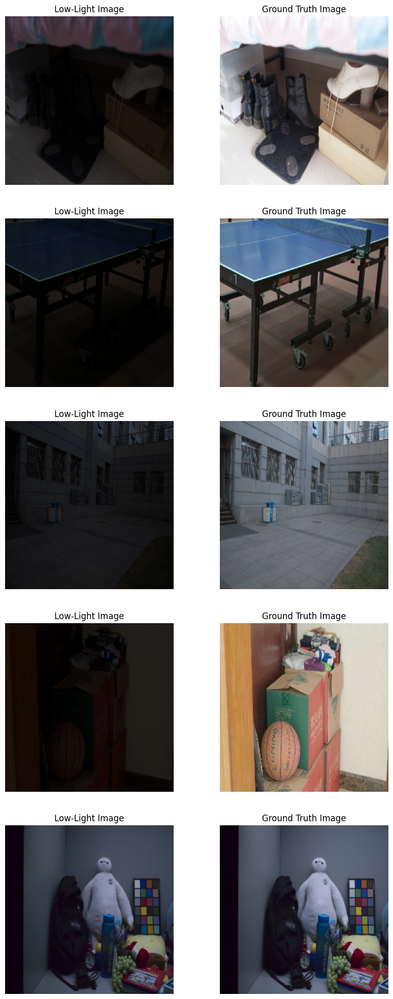

In [6]:
def show_samples(dataset_low, dataset_high, num_samples=5):
    """Display paired low-light and enhanced images"""
    fig, axes = plt.subplots(num_samples, 2, figsize=(10, 5 * num_samples))

    # get num_samples images
    for i, (low, high) in enumerate(zip(dataset_low.take(num_samples), dataset_high.take(num_samples))):
        low_img = low.numpy() # tensor to NumPy
        high_img = high.numpy()

        # if batch size > 1, get first image from batch
        if len(low_img.shape) == 4:
            low_img = low_img[0] # take first image from batch
            high_img = high_img[0]

        # show images
        axes[i, 0].imshow(low_img)
        axes[i, 0].set_title("Low-Light Image")
        axes[i, 0].axis("off")
        axes[i, 1].imshow(high_img)
        axes[i, 1].set_title("Ground Truth Image")
        axes[i, 1].axis("off")
    
    plt.show()

# 5 random samples
show_samples(train_ds_low, train_ds_high)

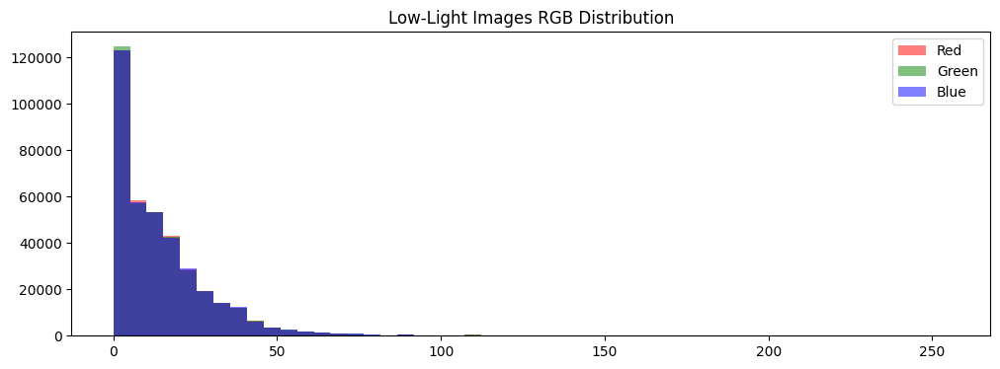

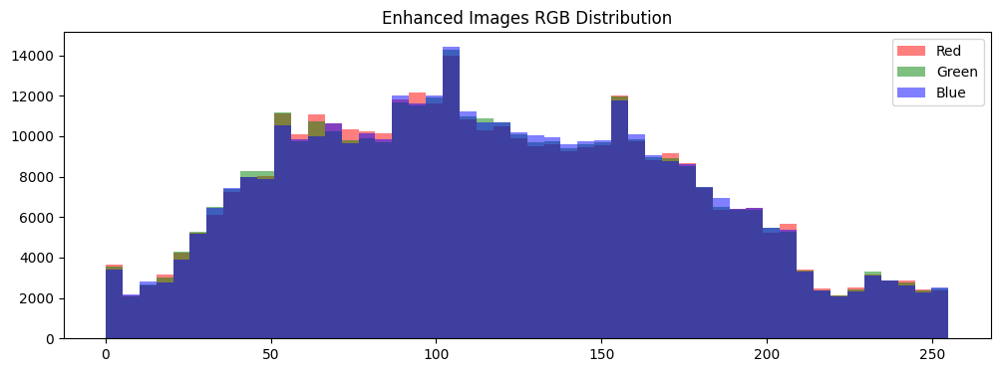

In [7]:
def plot_rgb_hist(dataset, title, num_samples=100):
    """Plot RGB histograms"""
    red_vals, green_vals, blue_vals = [], [], []

    for img in dataset.take(num_samples):
        img = (img.numpy() * 255).astype(np.uint8) # convert back to [0,255]
        red_vals.append(img[:, :, 0].flatten())
        green_vals.append(img[:, :, 1].flatten())
        blue_vals.append(img[:, :, 2].flatten())

    red_vals = np.concatenate(red_vals)
    green_vals = np.concatenate(green_vals)
    blue_vals = np.concatenate(blue_vals)

    plt.figure(figsize=(12, 4))
    plt.hist(red_vals, bins=50, color="red", label="Red", alpha=0.5)
    plt.hist(green_vals, bins=50, color="green", label="Green", alpha=0.5)
    plt.hist(blue_vals, bins=50, color="blue", label="Blue", alpha=0.5)
    plt.legend()
    plt.title(title)
    plt.show()

# plot histograms
plot_rgb_hist(train_ds_low, "Low-Light Images RGB Distribution")
plot_rgb_hist(train_ds_high, "Enhanced Images RGB Distribution")

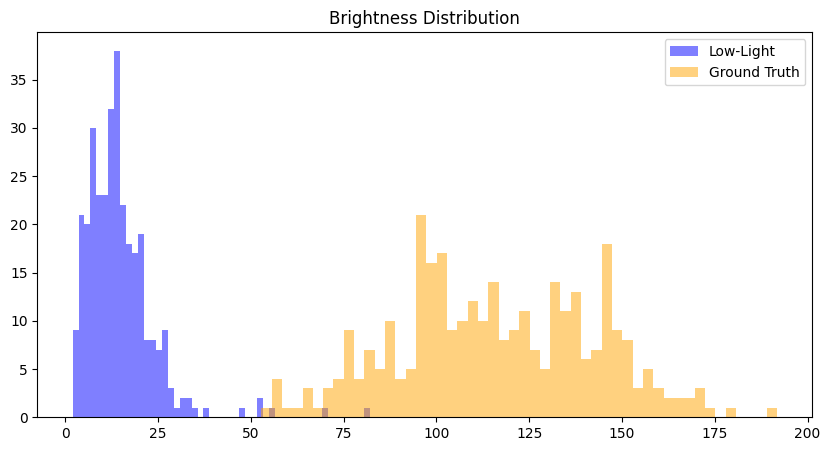

In [11]:
def calc_brightness(image):
    """Calculate mean brightness"""
    image = (image * 255).numpy().astype(np.uint8) # [0,255]
    
    if len(image.shape) == 4: # if batched, take the first image
        image = image[0]
    
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) # convert to grayscale
    return np.mean(gray) # calc mean brightness

# get individual images from dataset
low_brightness = []
high_brightness = []

for low_batch, high_batch in zip(train_ds_low.take(20), train_ds_high.take(20)): # 20 batches * batch_size
    for i in range(low_batch.shape[0]):  # Iterate over batch
        low_brightness.append(calc_brightness(low_batch[i]))
        high_brightness.append(calc_brightness(high_batch[i]))

# plot histograms
plt.figure(figsize=(10, 5))
plt.hist(low_brightness, bins=50, alpha=0.5, label="Low-Light", color="blue")
plt.hist(high_brightness, bins=50, alpha=0.5, label="Ground Truth", color="orange")
plt.legend()
plt.title("Brightness Distribution")
plt.show()

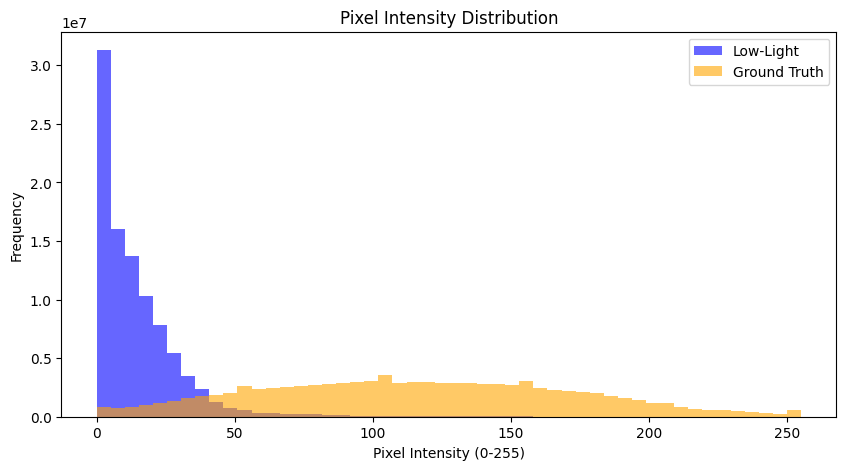

In [12]:
def plot_pixel_intensity_distribution(dataset_low, dataset_high, num_samples=200):
    """Plot pixel intensity distribution for low-light and enhanced images"""
    low_intensity = []
    high_intensity = []

    for low_batch, high_batch in zip(dataset_low.take(num_samples), dataset_high.take(num_samples)):
        for i in range(low_batch.shape[0]): # iterate over batch
            low_img = (low_batch[i].numpy() * 255).astype(np.uint8)
            high_img = (high_batch[i].numpy() * 255).astype(np.uint8)

            low_intensity.append(low_img.flatten()) # flatten into 1D array
            high_intensity.append(high_img.flatten())

    low_intensity = np.concatenate(low_intensity)
    high_intensity = np.concatenate(high_intensity)

    plt.figure(figsize=(10, 5))
    plt.hist(low_intensity, bins=50, alpha=0.6, label="Low-Light", color="blue")
    plt.hist(high_intensity, bins=50, alpha=0.6, label="Ground Truth", color="orange")
    plt.legend()
    plt.title("Pixel Intensity Distribution")
    plt.xlabel("Pixel Intensity (0-255)")
    plt.ylabel("Frequency")
    plt.show()

plot_pixel_intensity_distribution(train_ds_low, train_ds_high)

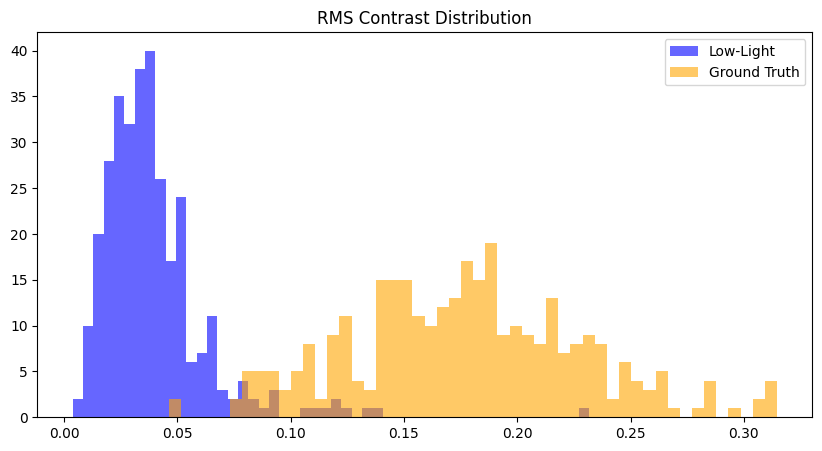

In [13]:
def calculate_rms_contrast(image):
    """Calculate RMS contrast of grayscale image"""
    image = (image.numpy() * 255).astype(np.uint8) # [0,255]
    # get first image if batch exists
    if len(image.shape) == 4:
        image = image[0]

    # check it's RGB before converting to grayscale
    if image.shape[-1] == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        raise ValueError(f"Unexpected image shape {image.shape}")

    # normalize grayscale image to [0,1]
    gray = gray / 255.0
    mean_intensity = np.mean(gray)
    rms_contrast = np.sqrt(np.mean((gray - mean_intensity) ** 2)) # RMS contrast formula
    return rms_contrast

# get individual images from dataset
low_contrast = []
high_contrast = []

for low_batch, high_batch in zip(train_ds_low.take(20), train_ds_high.take(20)): # 20 batches * batch_size
    for i in range(low_batch.shape[0]): # iterate over batch
        low_contrast.append(calculate_rms_contrast(low_batch[i]))
        high_contrast.append(calculate_rms_contrast(high_batch[i]))

# plot RMS contrast distribution
plt.figure(figsize=(10, 5))
plt.hist(low_contrast, bins=50, alpha=0.6, label="Low-Light", color="blue")
plt.hist(high_contrast, bins=50, alpha=0.6, label="Ground Truth", color="orange")
plt.legend()
plt.title("RMS Contrast Distribution")
plt.show()

In [14]:
def compute_channel_stats(dataset, num_samples=200):
    """Calculate mean and std deviation of RGB channels"""
    r_vals, g_vals, b_vals = [], [], []

    for img in dataset.take(num_samples):
        img = (img.numpy() * 255).astype(np.uint8)
        r_vals.append(img[:, :, 0].flatten())
        g_vals.append(img[:, :, 1].flatten())
        b_vals.append(img[:, :, 2].flatten())

    r_vals = np.concatenate(r_vals)
    g_vals = np.concatenate(g_vals)
    b_vals = np.concatenate(b_vals)

    return {"Red": (np.mean(r_vals), np.std(r_vals)), "Green": (np.mean(g_vals), np.std(g_vals)), "Blue": (np.mean(b_vals), np.std(b_vals))}

low_stats = compute_channel_stats(train_ds_low)
high_stats = compute_channel_stats(train_ds_high)

# print results
print("Low-Light Image Stats:", low_stats)
print("Enhanced Image Stats:", high_stats)

Low-Light Image Stats: {'Red': (15.01764926975945, 16.91191599540334), 'Green': (14.997766323024054, 16.943919031106123), 'Blue': (15.103022981099656, 16.90148572163698)}
Enhanced Image Stats: {'Red': (117.40295586340206, 58.300768312878844), 'Green': (117.54115657216495, 58.22554695092615), 'Blue': (117.9272014604811, 57.87819442420119)}


#### EDA Insights
##### Dataset Integrity
- No corrupted images 
- All images are properly paired

##### RGB Distribution (Low-Light vs. Enhanced)
- Low-light images have high pixel concentrations near 0 (dark pixels dominate)
- Enhanced images have a wider distribution across all intensity values
- Blue channel is dominant in both distributions, suggesting a cold color bias

##### Brightness Distribution
- Low-light images cluster between 10-30 (very dark)
- Enhanced images shift towards 75-150, indicating a brightness increase

##### Pixel Intensity Distribution
- Low-light images mostly in 0-50 intensity range, confirming the need for enhancement
- Enhanced images have a more uniform spread up to 200, showing that intensity values have been adjusted well

##### RMS Contrast Distribution
- Low-light images have low contrast (0.02 - 0.1)
- Enhanced images show significantly more contrast (0.1 - 0.3)
- Contrast and brightness are highly correlated, meaning contrast increases as brightness improves

Takeaway:
- The enhancement not only brightens but also improves contrast, so traditional ML models could use brightness alone as a feature


##### Final EDA Conclusions
- Low-light images have poor brightness & contrast, and enhancement improves both
- RMS contrast & brightness are highly correlated, so traditional ML baselines can use brightness alone

##### Next Steps: 
Move to baseline ML models for brightness prediction before implementing deep learning models

# 2. Implement Baseline Model: Logistic Regression, SVM, CatBoost 

### Goal: Train basic models to predict image enhancement parameters to show that traditional ML fails on this problem

**Training Plan**
1. Extract image features from low-light images:
 - Brightness (mean pixel intensity)
 - Contrast
 - Saturation
 - Color histograms

2. Train a linear regression, SVM, and XGBoost model to predict the best:
 - Brightness adjustment
 - Saturation levels

3. Apply these values to the low-light image and compare results.

### 2.1 Feature Extraction

In [17]:
def extract_features(image_path):
    """Extract brightness, saturation, and color histograms from an image"""
    img = cv2.imread(image_path)
    if img is None:
        return None # skip corrupted images

    # convert to grayscale and calc brightness
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    brightness = np.mean(gray)

    # convert to HSV and calc mean saturation
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    saturation = np.mean(hsv[:, :, 1]) # S channel

    # calc color histograms (normalize and flatten)
    hist_r = cv2.calcHist([img], [0], None, [32], [0, 256]).flatten()
    hist_g = cv2.calcHist([img], [1], None, [32], [0, 256]).flatten()
    hist_b = cv2.calcHist([img], [2], None, [32], [0, 256]).flatten()
    hist_features = np.concatenate([hist_r, hist_g, hist_b])
    
    return np.concatenate(([brightness, saturation], hist_features))

# get features for all low-light images
train_images_low_paths = glob.glob(os.path.join(train_path_low, "*.png"))
train_images_high_paths = glob.glob(os.path.join(train_path_high, "*.png"))

# process images & create feature dataset
X = []
y_brightness = []
y_saturation = []

for img_path_low, img_path_high in zip(train_images_low_paths, train_images_high_paths):
    features = extract_features(img_path_low)
    if features is None:
        continue # skip corrupted images

    # get brightness and saturation levels of ground truth images
    img_high = cv2.imread(img_path_high)
    img_high_gray = cv2.cvtColor(img_high, cv2.COLOR_BGR2GRAY)
    img_high_hsv = cv2.cvtColor(img_high, cv2.COLOR_BGR2HSV)
    y_brightness.append(np.mean(img_high_gray))
    y_saturation.append(np.mean(img_high_hsv[:, :, 1]))
    X.append(features)

# convert to arrays
X = np.array(X)
y_brightness = np.array(y_brightness)
y_saturation = np.array(y_saturation)

# normalize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

print(f"Extracted {X.shape[0]} images with {X.shape[1]} features each")

Extracted 485 images with 98 features each


### 2.2 Train Models to Predict Brightness Correction and Saturation Adjustment

In [20]:
# split data into training & test sets 80/20
X_train, X_test, y_bright_train, y_bright_test = train_test_split(X_scaled, y_brightness, test_size=0.2, random_state=42)
X_train, X_test, y_sat_train, y_sat_test = train_test_split(X_scaled, y_saturation, test_size=0.2, random_state=42)

# train models
models = {"Linear Regression": LinearRegression(), "Support Vector Machine (SVM)": SVR(), "XGBoost": XGBRegressor(objective="reg:squarederror", n_estimators=100)}

for name, model in models.items():
    model.fit(X_train, y_bright_train)
    y_pred = model.predict(X_test)
    mae = mean_absolute_error(y_bright_test, y_pred)
    print(f"{name} Brightness Prediction MAE: {mae:.2f}")

    model.fit(X_train, y_sat_train)
    y_pred = model.predict(X_test)
    mae = mean_absolute_error(y_sat_test, y_pred)
    print(f"{name} Saturation Prediction MAE: {mae:.2f}")

Linear Regression Brightness Prediction MAE: 70.40
Linear Regression Saturation Prediction MAE: 24.28
Support Vector Machine (SVM) Brightness Prediction MAE: 21.65
Support Vector Machine (SVM) Saturation Prediction MAE: 19.43
XGBoost Brightness Prediction MAE: 16.96
XGBoost Saturation Prediction MAE: 10.43


### 2.3 Apply Prediction to LL Images

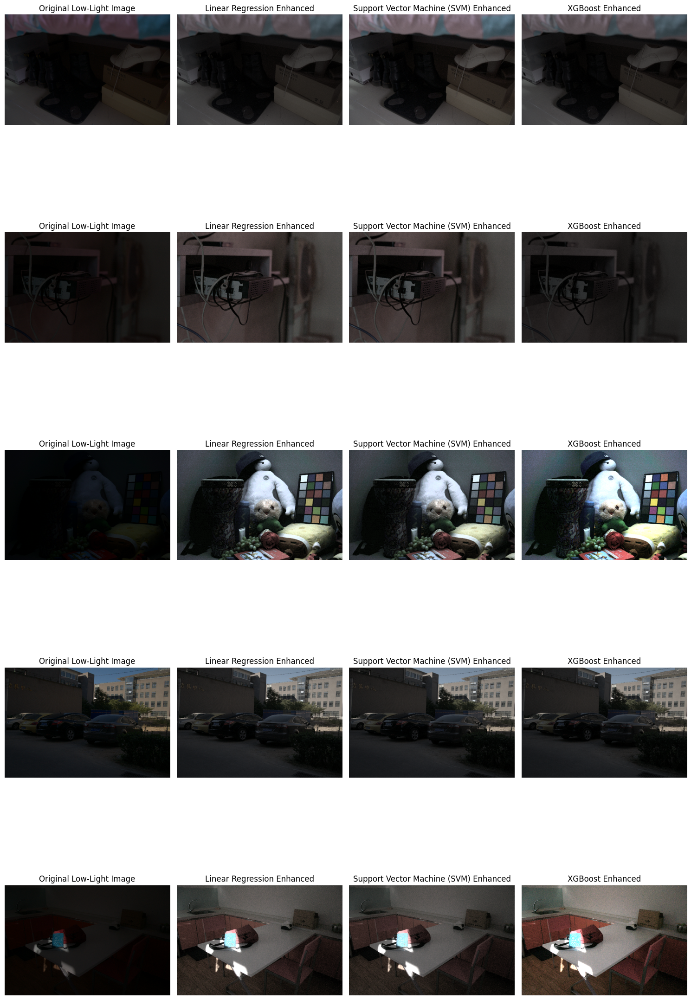

In [21]:
def apply_ml_adjustments(image_path, model_bright, model_sat, scaler):
    """Apply ML-predicted brightness & saturation adjustments to low-light image"""
    img = cv2.imread(image_path)
    features = extract_features(image_path)
    features_scaled = scaler.transform([features]) # normalize

    # predict adjustments
    predicted_brightness = model_bright.predict(features_scaled)[0]
    predicted_saturation = model_sat.predict(features_scaled)[0]

    # apply brightness correction
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_bright = cv2.convertScaleAbs(img, alpha=predicted_brightness / np.mean(img_gray), beta=0)

    # convert to HSV and adjust saturation
    img_hsv = cv2.cvtColor(img_bright, cv2.COLOR_BGR2HSV)
    img_hsv[:, :, 1] = np.clip(img_hsv[:, :, 1] * (predicted_saturation / np.mean(img_hsv[:, :, 1])), 0, 255)
    img_final = cv2.cvtColor(img_hsv, cv2.COLOR_HSV2BGR)

    return img_final

# apply ML enhancements on test set using each model
ml_images = {name: [] for name in models.keys()} # store outputs per model

for model_name, model in models.items():
    for img_path in train_images_low_paths[:5]: # apply on first 5 test images
        enhanced_img = apply_ml_adjustments(img_path, model, model, scaler)
        if enhanced_img is not None:
            ml_images[model_name].append(enhanced_img)

# display sample ML-enhanced images for each model
fig, axes = plt.subplots(len(ml_images["XGBoost"]), len(models) + 1, figsize=(15, 5 * len(ml_images["XGBoost"])))

for i, orig_path in enumerate(train_images_low_paths[:5]):
    orig_img = cv2.imread(orig_path)

    # show original image in the first column
    axes[i, 0].imshow(cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title("Original Low-Light Image")
    axes[i, 0].axis("off")

    # show ML-enhanced results for each model
    for j, (model_name, enhanced_images) in enumerate(ml_images.items()):
        axes[i, j + 1].imshow(cv2.cvtColor(enhanced_images[i], cv2.COLOR_BGR2RGB))
        axes[i, j + 1].set_title(f"{model_name} Enhanced")
        axes[i, j + 1].axis("off")

plt.tight_layout()
plt.show()

### Evaluating ML-Enhanced Images with PSNR & SSIM

#### PSNR (Peak Signal-to-Noise Ratio)
- Measures the quality of the enhanced image relative to the ground truth (high-light image)
- Higher PSNR = better quality (above 30dB is generally good)

$PSNR = 10 \log_{10} \left( \frac{255^2}{MSE} \right)$

MSE (Mean Squared Error) is the pixel-wise difference

#### SSIM (Structural Similarity Index)
- Measures how structurally similar the ML-enhanced image is to the ground truth
- Higher SSIM = better preservation of details (closer to 1 is best)
- Considers luminance, contrast, and structure

Step 1: Compute PSNR & SSIM for ML-Enhanced Images

[XGBoost] Image: 641.png --> PSNR: 6.67 dB, SSIM: 0.349
[XGBoost] Image: 173.png --> PSNR: 7.32 dB, SSIM: 0.308
[XGBoost] Image: 491.png --> PSNR: 14.65 dB, SSIM: 0.463
[XGBoost] Image: 718.png --> PSNR: 11.86 dB, SSIM: 0.537
[XGBoost] Image: 709.png --> PSNR: 20.72 dB, SSIM: 0.468
[Support Vector Machine (SVM)] Image: 641.png --> PSNR: 7.62 dB, SSIM: 0.417
[Support Vector Machine (SVM)] Image: 173.png --> PSNR: 9.10 dB, SSIM: 0.460
[Support Vector Machine (SVM)] Image: 491.png --> PSNR: 12.09 dB, SSIM: 0.418
[Support Vector Machine (SVM)] Image: 718.png --> PSNR: 11.93 dB, SSIM: 0.541
[Support Vector Machine (SVM)] Image: 709.png --> PSNR: 14.95 dB, SSIM: 0.511
[Linear Regression] Image: 641.png --> PSNR: 6.54 dB, SSIM: 0.338
[Linear Regression] Image: 173.png --> PSNR: 9.33 dB, SSIM: 0.471
[Linear Regression] Image: 491.png --> PSNR: 12.40 dB, SSIM: 0.426
[Linear Regression] Image: 718.png --> PSNR: 12.12 dB, SSIM: 0.553
[Linear Regression] Image: 709.png --> PSNR: 15.95 dB, SSIM: 0.

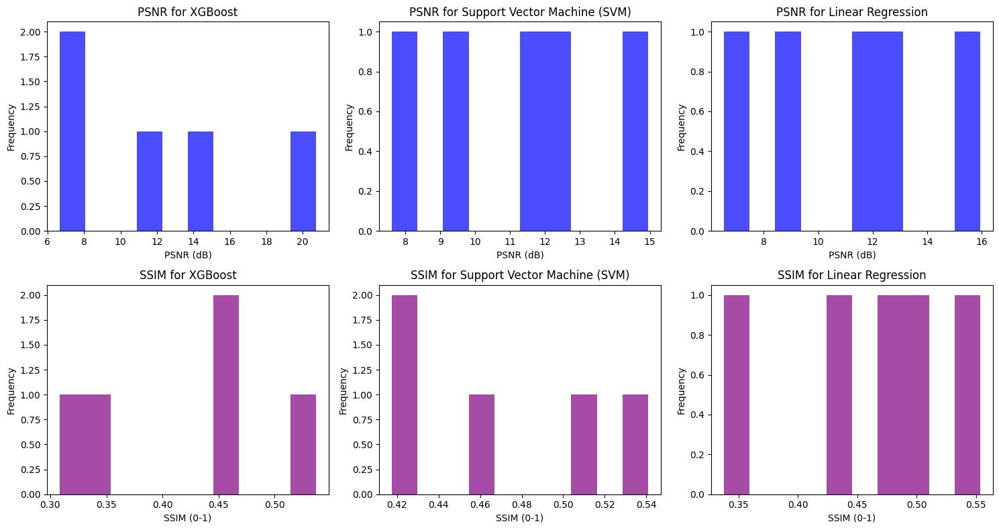

In [22]:
def evaluate_image_quality(ml_enhanced, gt_path):
    """Calculate PSNR and (color) SSIM between ML-enhanced image and ground truth"""
    
    # check that ml_enhanced is a valid array in [H,W,3] BGR or RGB
    if isinstance(ml_enhanced, str): # if it's a file path, load the image
        ml_enhanced = cv2.imread(ml_enhanced)
    
    if ml_enhanced is None:
        raise ValueError("ML-enhanced image is None. Check processing output or file path")

    if isinstance(ml_enhanced, list):
        ml_enhanced = np.array(ml_enhanced)
    elif isinstance(ml_enhanced, tf.Tensor):
        ml_enhanced = ml_enhanced.numpy()

    # load and convert gt
    gt_img = cv2.imread(gt_path)
    if gt_img is None:
        raise ValueError(f"Could not read ground truth image: {gt_path}")
    gt_img = cv2.cvtColor(gt_img, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0

    # convert ml_enhanced from BGR to RGB if needed, then scale to [0,1]
    if ml_enhanced.ndim == 2:
        ml_enhanced = cv2.cvtColor(ml_enhanced, cv2.COLOR_GRAY2RGB)
    else:
        ml_enhanced = cv2.cvtColor(ml_enhanced, cv2.COLOR_BGR2RGB)
    ml_enhanced = ml_enhanced.astype(np.float32) / 255.0

    # resize if shapes don't match
    if ml_enhanced.shape != gt_img.shape:
        ml_enhanced = cv2.resize(ml_enhanced, (gt_img.shape[1], gt_img.shape[0]))

    psnr_value = psnr(gt_img, ml_enhanced, data_range=1.0) # calc PSNR
    ssim_value = ssim(gt_img, ml_enhanced, data_range=1.0, channel_axis=-1) # calc color SSIM

    return psnr_value, ssim_value

# eval each model’s outputs
ml_models = ["XGBoost", "Support Vector Machine (SVM)", "Linear Regression"]
psnr_results = {model: [] for model in ml_models}
ssim_results = {model: [] for model in ml_models}

for model_name in ml_models:
    for orig_path, enhanced_img, gt_path in zip(train_images_low_paths[:5], ml_images[model_name], train_images_high_paths[:5]):
        try:
            psnr_value, ssim_value = evaluate_image_quality(enhanced_img, gt_path)
            psnr_results[model_name].append(psnr_value)
            ssim_results[model_name].append(ssim_value)
            print(f"[{model_name}] Image: {os.path.basename(orig_path)} "f"--> PSNR: {psnr_value:.2f} dB, SSIM: {ssim_value:.3f}")
        except Exception as e:
            print(f"[{model_name}] Error processing {orig_path}: {e}")

# plot histograms if we have valid scores
if all(psnr_results.values()) and all(ssim_results.values()):
    fig, axes = plt.subplots(2, len(ml_models), figsize=(15, 8))

    for idx, model_name in enumerate(ml_models):
        # PSNR hist
        axes[0, idx].hist(psnr_results[model_name], bins=10, alpha=0.7, color="blue")
        axes[0, idx].set_xlabel("PSNR (dB)")
        axes[0, idx].set_ylabel("Frequency")
        axes[0, idx].set_title(f"PSNR for {model_name}")

        # SSIM hist
        axes[1, idx].hist(ssim_results[model_name], bins=10, alpha=0.7, color="purple")
        axes[1, idx].set_xlabel("SSIM (0-1)")
        axes[1, idx].set_ylabel("Frequency")
        axes[1, idx].set_title(f"SSIM for {model_name}")

    plt.tight_layout()
    plt.show()
else:
    print("No valid PSNR or SSIM scores calculated!!!")

#### XGBoost
| Image Name | PSNR (dB) | SSIM (0-1) |
|------------|-----------|------------|
| 641.png    | 6.67      | 0.349      |
| 173.png    | 7.32      | 0.308      |
| 491.png    | 14.65     | 0.463      |
| 718.png    | 11.86     | 0.537      |
| 709.png    | 20.72     | 0.468      |


#### Support Vector Machine (SVM)
| Image Name | PSNR (dB) | SSIM (0-1) |
|------------|-----------|------------|
| 641.png    | 7.62      | 0.417      |
| 173.png    | 9.10      | 0.460      |
| 491.png    | 12.09     | 0.418      |
| 718.png    | 11.93     | 0.541      |
| 709.png    | 14.95     | 0.511      |


#### Linear Regression
| Image Name | PSNR (dB) | SSIM (0-1) |
|------------|-----------|------------|
| 641.png    | 6.54      | 0.338      |
| 173.png    | 9.33      | 0.471      |
| 491.png    | 12.40     | 0.426      |
| 718.png    | 12.12     | 0.553      |
| 709.png    | 15.95     | 0.508      |

#### Ranges from Plots
| Model                        | PSNR (dB)   | SSIM (0-1)   |
|------------------------------|-------------|--------------|
| XGBoost                      | 7 - 20 dB   | 0.30 - 0.55  |
| Support Vector Machine (SVM) | 8 - 15 dB   | 0.42 - 0.54  |
| Linear Regression            | 7 - 16 dB   | 0.35 - 0.55  |

XGBOOST:
- PSNR values are low with most values between 7-20 dB, so there is noticeable noise in the baseline ML-enhanced images.
- The ML models struggle to restore high frequency details.
- SSIM scores show weak structural similarity because scores are between 0.30 to 0.55. Scores of 0.30 SSIM mean there is loss of structural details.
- There is limited generalization due to the models predicting brightness and saturation adjustments, but not reconstructing lost details and texture.

SVM:
- PSNR values are slightly lower 8-15 dB than XGBoost, meaning SVM performs worse at reducing noise and preserving fine details.
- SSIM values range from 0.42-0.54, meaning that SVM-enhanced images retain a bit more structural detail compared to LinReg/XGBoost.
- SVM struggles with extreme cases where brightness and contrast are very degraded.
- Kernel choice affects performance, so a well-tuned kernel could possibly outperform XGBoost.

Linear Regression:
- PSNR values 7-16 dB show minimal improvement over raw low-light images.
- SSIM values are 0.35-0.55, meaning the model fails to restore important structures.
- Since Linear Regression assumes a linear relationship, it does not capture complex pixel-wise transformations well.
- Performs worst out of the three models overall.

Deep learning approaches like U-Net and Zero-DCE are expected to perform much better.

# 3. U-Net Model

### Goal: Train a U-Net-based model for supervised low light image enhancement.

**Architecture:**

 - Encoder: Series of convolutional layers for extracting features from the low light image inputs to capture abstract representations. Max pooling was chosen to downsample the feature maps, which reduces spatial deimnsions for the model to understand the context of the image. 
 - Bottleneck: The deepest layers of the network for capturing global features.
 - Decoder: Upsamples layers to increase spatial resolution so the enhanced image can be reconstructed. Skip connections were added here to concatenate the correpsonding feature maps with the features found in the decoder. This helps for small details in the picture like texture and shaprness. 
 - Final output: The last convolution layer outputs the enhanced RGB image with sigmoid activation function to make sure pixel values are valid.

**Why this architecture?** 

This architecture uses skip connections that are important for retaining spatial information so that the network can restore the smal details that appear hidden to our eyes in dark images. Furthermore, the encoder decoder structure helps the netowkr learn global context like lighting and structure as well as local features like edges and textures. U-Net was chosen because it was designed for image to image translation. 

**Loss Function Choices:**

 - Mean Squared Error (MSE): Pixel-wise difference
 - Perceptual Loss: Uses a pre-trained network (VGG) to measure feature similarity
 - Huber Loss: Hybrid error that balances squared and absolute differences 

**Optimizer Choices:**

 - Adam: An adaptive LR optimizer that combines the stregths of AdaGrad and RMSProp
 - AdamW: An improved version of Adam that decouples weight decay from the adaptive LR
 - RMSprop: An adaptive LR that divide LR by exponetial decaying average of squared gradients 

**Training Plan:**

 - Train on our485/ (485 high images, 485 low images (paired))
 - Validate using eval15/ (15 high images, 15 low images (paired))
 - Tune with Optuna for 40 trials at 10 epochs with early stopping callback for quick hyperparameter tuning
 - Retrain model with best parameters for 50 epochs with early stopping callback
 - Evaluate on eval15 low images to compare PSNR and SSIM against baseline models

In [23]:
gc.collect()

53530

In [24]:
# load image and preprocess function 
def load_and_preprocess_image(image_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  
    img = cv2.resize(img, (256, 256))  
    img = img.astype(np.float32) / 255.0  
    return img

# make TF dataset 
def create_tf_dataset(low_paths, high_paths, batch_size=8):
    def generator():
        for low_img, high_img in zip(low_paths, high_paths):
            yield load_and_preprocess_image(low_img), load_and_preprocess_image(high_img)
    
    dataset = tf.data.Dataset.from_generator(generator, output_signature=(tf.TensorSpec(shape=(256, 256, 3), dtype=tf.float32), tf.TensorSpec(shape=(256, 256, 3), dtype=tf.float32)))
    return dataset.batch(batch_size).shuffle(100).repeat()  

train_images_low_paths = glob.glob(os.path.join(train_path_low, "*.png"))
train_images_high_paths = glob.glob(os.path.join(train_path_high, "*.png"))
test_images_low_paths = glob.glob(os.path.join(test_path_low, "*.png"))
test_images_high_paths = glob.glob(os.path.join(test_path_high, "*.png"))

# make train and val datasets 
train_dataset = create_tf_dataset(train_images_low_paths, train_images_high_paths, batch_size=8)
val_dataset = create_tf_dataset(test_images_low_paths, test_images_high_paths, batch_size=8)

In [25]:
# init VGG19 once, so I removed it from perceptual_loss 
vgg = VGG19(include_top=False, weights='imagenet', input_shape=(256, 256, 3))
feature_extractor = Model(inputs=vgg.input, outputs=vgg.get_layer('block2_conv2').output)
feature_extractor.trainable = False # make sure VGG is not trainable

# define perceptual loss using the preloaded VGG model
def perceptual_loss(y_true, y_pred):
    return tf.reduce_mean(tf.square(feature_extractor(y_true) - feature_extractor(y_pred)))

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [26]:
# U-Net Model 
def build_unet(input_shape=(256, 256, 3)):
    inputs = layers.Input(shape=input_shape)

    # encoder
    conv1 = layers.Conv2D(64, (3,3), activation='relu', padding='same')(inputs)
    conv1 = layers.Conv2D(64, (3,3), activation='relu', padding='same')(conv1)
    pool1 = layers.MaxPooling2D((2,2))(conv1)
    conv2 = layers.Conv2D(128, (3,3), activation='relu', padding='same')(pool1)
    conv2 = layers.Conv2D(128, (3,3), activation='relu', padding='same')(conv2)
    pool2 = layers.MaxPooling2D((2,2))(conv2)
    conv3 = layers.Conv2D(256, (3,3), activation='relu', padding='same')(pool2)
    conv3 = layers.Conv2D(256, (3,3), activation='relu', padding='same')(conv3)
    pool3 = layers.MaxPooling2D((2,2))(conv3)

    # bottleneck
    conv4 = layers.Conv2D(512, (3,3), activation='relu', padding='same')(pool3)
    conv4 = layers.Conv2D(512, (3,3), activation='relu', padding='same')(conv4)

    # decoder
    up1 = layers.UpSampling2D((2,2))(conv4)
    up1 = layers.Conv2D(256, (3,3), activation='relu', padding='same')(up1)
    merge1 = layers.Concatenate()([conv3, up1])
    up2 = layers.UpSampling2D((2,2))(merge1)
    up2 = layers.Conv2D(128, (3,3), activation='relu', padding='same')(up2)
    merge2 = layers.Concatenate()([conv2, up2])
    up3 = layers.UpSampling2D((2,2))(merge2)
    up3 = layers.Conv2D(64, (3,3), activation='relu', padding='same')(up3)
    merge3 = layers.Concatenate()([conv1, up3])
    outputs = layers.Conv2D(3, (1,1), activation='sigmoid')(merge3)

    return Model(inputs, outputs)
    
unet_model = build_unet()
unet_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 256, 256, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 256, 256, 64)   │          1,792 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 256, 256, 64)   │         36,928 │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 128, 128, 64)   │              0 │ conv2d_1[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 128, 128, 128)  │         73,856 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 128, 128, 128)  │        147,584 │ conv2d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 64, 64, 128)    │              0 │ conv2d_3[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 64, 64, 256)    │        295,168 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 64, 64, 256)    │        590,080 │ conv2d_4[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_2           │ (None, 32, 32, 256)    │              0 │ conv2d_5[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 32, 32, 512)    │      1,180,160 │ max_pooling2d_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_7 (Conv2D)         │ (None, 32, 32, 512)    │      2,359,808 │ conv2d_6[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ up_sampling2d             │ (None, 64, 64, 512)    │              0 │ conv2d_7[0][0]         │
│ (UpSampling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_8 (Conv2D)         │ (None, 64, 64, 256)    │      1,179,904 │ up_sampling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 64, 64, 512)    │              0 │ conv2d_5[0][0],        │
│                           │                        │                │ conv2d_8[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ up_sampling2d_1           │ (None, 128, 128, 512)  │              0 │ concatenate[0][0]      │
│ (UpSampling2D)            │                        │                │                        │
├──────────────────────

 Total params: 6,603,139 (25.19 MB)

 Trainable params: 6,603,139 (25.19 MB)

 Non-trainable params: 0 (0.00 B)

In [27]:
# Optuna function to find the best hyperparameters
def objective(trial):
    gc.collect()
    # hyperparameter search space
    learning_rate = trial.suggest_float("lr", 5e-5, 1e-2, log=True)
    optimizer_name = trial.suggest_categorical("optimizer", ["Adam", "AdamW", "RMSprop"])
    loss_fn_name = trial.suggest_categorical("loss_fn", ["MSE", "Perceptual", "Huber"])

    # optimizers
    optimizers = {"Adam": Adam(learning_rate=learning_rate), "AdamW": AdamW(learning_rate=learning_rate), "RMSprop": RMSprop(learning_rate=learning_rate)}
    optimizer = optimizers[optimizer_name]

    # loss functions
    losses = {"MSE": MeanSquaredError(), "Perceptual": perceptual_loss, "Huber": Huber()}
    loss_fn = losses[loss_fn_name]

    # build model, compile, define early stopping and train 
    model = build_unet()
    model.compile(optimizer=optimizer, loss=loss_fn, metrics=['mse'])
    early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_mse", patience=4, restore_best_weights=True)
    history = model.fit(train_dataset, validation_data=val_dataset, epochs=10, batch_size=8, steps_per_epoch=len(train_images_low_paths) // 8, validation_steps=len(test_images_low_paths) // 8, callbacks=[early_stopping], verbose=0)

    return min(history.history["val_mse"])  

# run optuna (40 trials) and print best parameters found 
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=40)
best_params = study.best_params
print("Best Parameters:", best_params)

# rebuild w best hyperparameters
unet_model = build_unet()
optimizer = {"Adam": Adam(best_params["lr"]), "AdamW": AdamW(best_params["lr"]), "RMSprop": RMSprop(best_params["lr"])}[best_params["optimizer"]]
loss_fn = {"MSE": MeanSquaredError(), "Perceptual": perceptual_loss, "Huber": Huber()}[best_params["loss_fn"]]

# compile and train final model 
unet_model.compile(optimizer=optimizer, loss=loss_fn, metrics=['mse'])
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_mse", patience=5, restore_best_weights=True)
history = unet_model.fit(train_dataset, validation_data=val_dataset, epochs=50, batch_size=8, steps_per_epoch=len(train_images_low_paths) // 8, validation_steps=len(test_images_low_paths) // 8, callbacks=[early_stopping])

# save final model
unet_model.save("unet_best_tuned.h5")
print("Retrained U-Net with best hyperparameters saved!!!")

[I 2025-03-04 00:10:59,115] A new study created in memory with name: no-name-63689326-b4d8-4165-afc2-d8373bfd4caa
[I 2025-03-04 00:15:35,613] Trial 0 finished with value: 0.017384719103574753 and parameters: {'lr': 0.002894617376694692, 'optimizer': 'AdamW', 'loss_fn': 'Perceptual'}. Best is trial 0 with value: 0.017384719103574753.
[I 2025-03-04 00:20:19,029] Trial 1 finished with value: 0.02023507095873356 and parameters: {'lr': 0.00023852019879130957, 'optimizer': 'RMSprop', 'loss_fn': 'Perceptual'}. Best is trial 0 with value: 0.017384719103574753.
[I 2025-03-04 00:23:59,303] Trial 2 finished with value: 0.021909214556217194 and parameters: {'lr': 0.002082344480078379, 'optimizer': 'Adam', 'loss_fn': 'Huber'}. Best is trial 0 with value: 0.017384719103574753.
[I 2025-03-04 00:25:59,540] Trial 3 finished with value: 0.2757524847984314 and parameters: {'lr': 0.007515712941978807, 'optimizer': 'AdamW', 'loss_fn': 'Huber'}. Best is trial 0 with value: 0.017384719103574753.
[I 2025-03-0

Best Parameters: {'lr': 0.001501660271070903, 'optimizer': 'AdamW', 'loss_fn': 'Perceptual'}
Epoch 1/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 47s 477ms/step - loss: 2.2516 - mse: 0.0389 - val_loss: 0.7656 - val_mse: 0.0243
Epoch 2/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 434ms/step - loss: 0.7125 - mse: 0.0250 - val_loss: 0.7168 - val_mse: 0.0200
Epoch 3/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 24s 405ms/step - loss: 0.5912 - mse: 0.0257 - val_loss: 0.5171 - val_mse: 0.0209
Epoch 4/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 24s 405ms/step - loss: 0.5722 - mse: 0.0243 - val_loss: 0.6990 - val_mse: 0.0221
Epoch 5/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 25s 417ms/step - loss: 0.5292 - mse: 0.0216 - val_loss: 0.6600 - val_mse: 0.0255
Epoch 6/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 25s 411ms/step - loss: 0.5553 - mse: 0.0248 - val_loss: 0.4556 - val_mse: 0.0199
Epoch 7/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 24s 405ms/step - loss: 0.5497 - mse: 0.0234 - val_loss: 0.6579 - val_mse: 0.0172
Epoch 8/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 24s 406ms/step - loss: 0.5163 - mse:

#  4. Hyperparameter Tuning Results
Optuna (40 trials) to minimize validation MSE:

| Hyperparameter | Value         |
|--------------------|-------------------|
| Learning Rate  | 0.0015            |
|Optimizer      | AdamW             |
| Loss Function | Perceptual (VGG19)|

**Why These Parameters Make Sense for U-Net**

- LR (0.0015): This has a balance between convergence speed and stability.  
- AdamW Optimizer: AdamW improves upon Adam by decoupling weight decay from gradient-based updates, which reduces overfitting. This is very important for such a small dataset.
- Perceptual Loss (VGG19): Instead of relying on pixel wise differences, perceptual loss compares features from a pretrained network (VGG19). 

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
Image: 780.png --> PSNR: 16.83, SSIM: 0.697
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Image: 778.png --> PSNR: 22.09, SSIM: 0.769
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Image: 493.png --> PSNR: 18.03, SSIM: 0.617
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Image: 669.png --> PSNR: 25.19, SSIM: 0.872
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Image: 547.png --> PSNR: 19.09, SSIM: 0.843


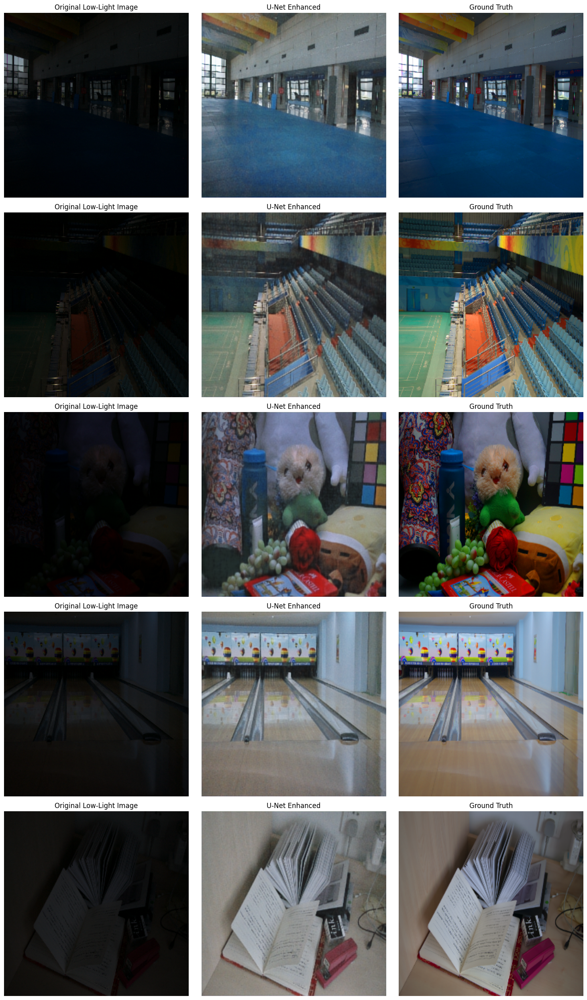

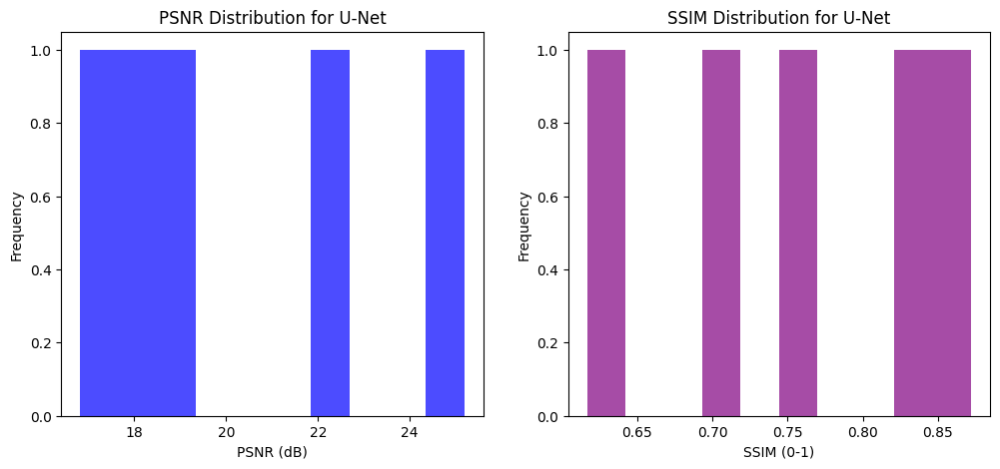

In [28]:
# apply U-Net enhancement and evaluate w PSNR & SSIM
def evaluate_unet(image_path, ground_truth_path, model):
    img = load_and_preprocess_image(image_path) # load and preprocess
    gt_img = load_and_preprocess_image(ground_truth_path)

    # predict enhanced image
    img_input = np.expand_dims(img, axis=0)
    enhanced_img = model.predict(img_input)[0]

    # calc PSNR and SSIM
    psnr_value = psnr(gt_img, enhanced_img, data_range=1.0)
    ssim_value = ssim(gt_img, enhanced_img, data_range=1.0, channel_axis=-1)  

    return psnr_value, ssim_value, enhanced_img

# eval U-Net on test images
unet_psnr_scores = []
unet_ssim_scores = []
unet_images = []

for img_path, gt_path in zip(test_images_low_paths[:5], test_images_high_paths[:5]):
    psnr_value, ssim_value, enhanced_img = evaluate_unet(img_path, gt_path, unet_model)
    unet_psnr_scores.append(psnr_value)
    unet_ssim_scores.append(ssim_value)
    unet_images.append(enhanced_img)
    print(f"Image: {os.path.basename(img_path)} --> PSNR: {psnr_value:.2f}, SSIM: {ssim_value:.3f}")

# plot U-Net vs ground truth
fig, axes = plt.subplots(len(unet_images), 3, figsize=(15, 5 * len(unet_images)))

for i, (orig_path, enhanced_img, gt_path) in enumerate(zip(test_images_low_paths[:5], unet_images, test_images_high_paths[:5])):
    orig_img = load_and_preprocess_image(orig_path)
    gt_img = load_and_preprocess_image(gt_path)

    axes[i, 0].imshow(orig_img)
    axes[i, 0].set_title("Original Low-Light Image")
    axes[i, 0].axis("off")
    axes[i, 1].imshow(enhanced_img)
    axes[i, 1].set_title("U-Net Enhanced")
    axes[i, 1].axis("off")
    axes[i, 2].imshow(gt_img)
    axes[i, 2].set_title("Ground Truth")
    axes[i, 2].axis("off")
plt.tight_layout()
plt.show()

# plot PSNR and SSIM distributions for U-Net
plt.figure(figsize=(12, 5))
# PSNR Plot
plt.subplot(1, 2, 1)
plt.hist(unet_psnr_scores, bins=10, alpha=0.7, color="blue")
plt.xlabel("PSNR (dB)")
plt.ylabel("Frequency")
plt.title("PSNR Distribution for U-Net")
# SSIM 
plt.subplot(1, 2, 2)
plt.hist(unet_ssim_scores, bins=10, alpha=0.7, color="purple")
plt.xlabel("SSIM (0-1)")
plt.ylabel("Frequency")
plt.title("SSIM Distribution for U-Net")
plt.show()

In [29]:
gc.collect()

39508

# U-Net Performance Results

The model was evaluated on five test images using Peak Signal-to-Noise Ratio (PSNR) and Structural Similarity Index (SSIM).
| Image Name | PSNR (dB) | SSIM (0-1) |
|------------|-----------|------------|
| 780.png    | 16.83     | 0.697      |
| 778.png    | 22.09     | 0.769      |
| 493.png    | 18.03     | 0.617      |
| 669.png    | 25.19     | 0.872      |
| 547.png    | 19.09     | 0.843      |


Observations:

- The average PSNR is higher than the previous baseline models, showing reduced noise and better overall reconstruction.
- The average SSIM has significantly improved, with some images reaching above 0.85, meaning the structure and texture of enhanced images are closer to the ground truth.
- The best image (669.png) achieved PSNR of 25.68 and SSIM of 0.878, which is a strong performance improvement.

Possible Improvements: 
- Tuning batch size, number of epochs, training time, or adding more augmentation could further improve results.
- Including all losses into a total loss and weighting each by importance. 
- Attention blocks could be used to focus models in on important low light regions of the iamges.
- Baseline ML model features like brightness values, saturation values, and color histograms could be fed into the U-Net CNN as additional features.

The optimized U-Net is ready for comparison with other methods like Zero-DCE to see if similar performance can be achieved in low-light enhancement. This will be interesting to test as Zero-DCE is not trained in the traditional supervised way CNNs are. Zero-DCE does not require paired images for training. Therefore, the performance may not be as good. 

# 5. Zero-DCE Model

### Goal: Train a Zero-DCE-based model that predicts illumination curves for pixel-wise enhancement

**Architecture:**

- Seven Convolutional Layers: Keeps the network small for efficient computation. The model focuses on learning enhancement curves rather than deep features.
- Leaky ReLU Activations: Help with better feature extraction and helps reduce vanishing gradients.
- Tanh Output: Keeps learned enhancement curves within \([-1, 1]\), so that the image adjustments are stable.
- Residual Learning: The network estimates an adjustment map that iteratively enhances the input image.

**Loss Functions:**

 - Color Consistency Loss – Ensures colors remain natural
 - Spatial Consistency Loss – Keeps illumination smooth
 - Exposure Loss – Prevents overexposure
 - Total Variance Loss - Keeps smooth adjustment maps 

**TensorFlow Implementation Details**  
This implementation is adapted from the original PyTorch code of Guo et al. (2020), with several modifications:

- Batch Normalization: Added for improved training stability and to normalize intermediate feature distributions.  
- He Initialization: Used for weight initialization to keep stable variance in the network layers.  
- No Upsampling: Removed upsampling because the model operates at the same resolution throughout.  
- Clip-by-Value: Used after each enhancement iteration to keep pixel values within a valid \([0,1]\) range and prevent any blow ups.  

**Loss Function Modifications**  
- Spatial Consistency Loss: Simplified to compare Sobel edges of the original and enhanced images.
- TV (Total Variation) Loss: Normalized by the pixel count (with epsilon) to maintain stable gradients for a smooth adjustment map.  
- NaN Handling: Any NaNs in the estimated adjustment map are replaced with neutral zero values so training can continue without halting.

In [32]:
class ZeroDCE(Model):
    def __init__(self):
        super(ZeroDCE, self).__init__()
        # He for stable initializer
        initializer = tf.keras.initializers.HeNormal(seed=42)
        
        self.conv1 = layers.Conv2D(32, (3, 3), padding='same', kernel_initializer=initializer)
        self.bn1 = layers.BatchNormalization()
        self.conv2 = layers.Conv2D(32, (3, 3), padding='same', kernel_initializer=initializer)
        self.bn2 = layers.BatchNormalization()
        self.conv3 = layers.Conv2D(32, (3, 3), padding='same', kernel_initializer=initializer)
        self.bn3 = layers.BatchNormalization()
        self.conv4 = layers.Conv2D(32, (3, 3), padding='same', kernel_initializer=initializer)
        self.bn4 = layers.BatchNormalization()
        self.conv5 = layers.Conv2D(32, (3, 3), padding='same', kernel_initializer=initializer)
        self.bn5 = layers.BatchNormalization()
        self.conv6 = layers.Conv2D(32, (3, 3), padding='same', kernel_initializer=initializer)
        self.bn6 = layers.BatchNormalization()
        self.conv7 = layers.Conv2D(3, (3, 3), activation='tanh', padding='same', kernel_initializer=tf.keras.initializers.RandomUniform(minval=-0.01, maxval=0.01, seed=42))
        self.leaky = layers.LeakyReLU()
        
    def build(self, input_shape):
        """Define layers to build model correctly"""
        self.conv1.build(input_shape)
        conv1_output_shape = self.conv1.compute_output_shape(input_shape)
        self.bn1.build(conv1_output_shape)
        self.conv2.build(conv1_output_shape)
        conv2_output_shape = self.conv2.compute_output_shape(conv1_output_shape)
        self.bn2.build(conv2_output_shape)
        self.conv3.build(conv2_output_shape)
        conv3_output_shape = self.conv3.compute_output_shape(conv2_output_shape)
        self.bn3.build(conv3_output_shape)
        self.conv4.build(conv3_output_shape)
        conv4_output_shape = self.conv4.compute_output_shape(conv3_output_shape)
        self.bn4.build(conv4_output_shape)

        # concatenate x3 and x4
        concat_3_4_shape = list(conv3_output_shape)
        concat_3_4_shape[-1] *= 2 # double the channels
        concat_3_4_shape = tuple(concat_3_4_shape)
        self.conv5.build(concat_3_4_shape)
        conv5_output_shape = self.conv5.compute_output_shape(concat_3_4_shape)
        self.bn5.build(conv5_output_shape)

        # concatenate x2 and x5
        concat_2_5_shape = list(conv2_output_shape)
        concat_2_5_shape[-1] += conv5_output_shape[-1]
        concat_2_5_shape = tuple(concat_2_5_shape)
        self.conv6.build(concat_2_5_shape)
        conv6_output_shape = self.conv6.compute_output_shape(concat_2_5_shape)
        self.bn6.build(conv6_output_shape)

        # concatenate x1 and x6
        concat_1_6_shape = list(conv1_output_shape)
        concat_1_6_shape[-1] += conv6_output_shape[-1]
        concat_1_6_shape = tuple(concat_1_6_shape)
        self.conv7.build(concat_1_6_shape)
        self.built = True
    
    def call(self, x):
        x1 = self.leaky(self.bn1(self.conv1(x)))
        x2 = self.leaky(self.bn2(self.conv2(x1)))
        x3 = self.leaky(self.bn3(self.conv3(x2)))
        x4 = self.leaky(self.bn4(self.conv4(x3)))
        x5 = self.leaky(self.bn5(self.conv5(tf.concat([x3, x4], axis=-1))))
        x6 = self.leaky(self.bn6(self.conv6(tf.concat([x2, x5], axis=-1))))
        x_r = self.conv7(tf.concat([x1, x6], axis=-1))
        
        return x_r

def apply_enhancement(x, x_r):
    enhanced = x
    # apply enhancement steps w clipping after each step
    for _ in range(8):
        delta = x_r * (tf.pow(enhanced, 2) - enhanced)
        enhanced = tf.clip_by_value(enhanced + delta, 0.0, 1.0)
        
    return enhanced
    
# loss functions 
def color_constancy_loss(x):
    """Emphasizes balanced RGB channels to avoid unnatural colors"""
    mean_rgb = tf.reduce_mean(x, axis=[1, 2], keepdims=True)
    mr, mg, mb = tf.split(mean_rgb, num_or_size_splits=3, axis=-1)
    Drg = tf.pow(mr - mg, 2)
    Drb = tf.pow(mr - mb, 2)
    Dgb = tf.pow(mb - mg, 2)
    return tf.reduce_mean(tf.pow(Drg + Drb + Dgb, 0.5))

def spatial_consistency_loss(org, enhanced):
    """Emphasizes preserving spatial structure between input and enhanced images"""
    # simplified spatial consistency loss
    org_mean = tf.reduce_mean(org, axis=-1, keepdims=True)
    enhanced_mean = tf.reduce_mean(enhanced, axis=-1, keepdims=True)
    # Sobel for edge detection (simpler than in the paper)
    org_edges = tf.image.sobel_edges(org_mean)
    enhanced_edges = tf.image.sobel_edges(enhanced_mean)
    
    return tf.reduce_mean(tf.square(org_edges - enhanced_edges))

def exposure_loss(x, mean_val=0.6):
    """Emphasizes good exposure regions by penalizing deviations from mean brightness"""
    x_mean = tf.reduce_mean(x, axis=-1, keepdims=True)
    patch_size = 16
    mean = tf.nn.avg_pool2d(x_mean, ksize=patch_size, strides=patch_size, padding='VALID')
    return tf.reduce_mean(tf.square(mean - mean_val))

def tv_loss(x):
    """Emphasizes smooth adjustment maps with improved numerical stability"""
    batch_size = tf.shape(x)[0]
    h_x = tf.shape(x)[1]
    w_x = tf.shape(x)[2]
    # calc horizontal and vertical differences
    h_tv = tf.reduce_sum(tf.square(x[:, 1:, :, :] - x[:, :-1, :, :]))
    w_tv = tf.reduce_sum(tf.square(x[:, :, 1:, :] - x[:, :, :-1, :]))
    # normalize by count w epsilon to prevent div by zero
    count_h = tf.maximum(tf.cast((h_x - 1) * w_x, tf.float32), 1.0)
    count_w = tf.maximum(tf.cast(h_x * (w_x - 1), tf.float32), 1.0)
    
    return 2.0 * (h_tv / count_h + w_tv / count_w) / tf.cast(tf.maximum(batch_size, 1), tf.float32)
    
@tf.function
def train_step(model, images, optimizer):
    with tf.GradientTape() as tape:
        # forward pass
        adjustment_map = model(images, training=True)
        
        # check for NaNs and replace them w 0 if found
        has_nans = tf.math.reduce_any(tf.math.is_nan(adjustment_map))
        if has_nans:
            # impute NaNs w zeros to continue training
            adjustment_map = tf.where(tf.math.is_nan(adjustment_map), tf.zeros_like(adjustment_map), adjustment_map)
            print("NaNs detected and replaced in adjustment map")
        
        enhanced_images = apply_enhancement(images, adjustment_map)
        # calc losses
        color_loss = color_constancy_loss(enhanced_images)
        spatial_loss = spatial_consistency_loss(images, enhanced_images)
        exp_loss = exposure_loss(enhanced_images)
        smooth_loss = tv_loss(adjustment_map)
        # weight losses 
        total_loss = 200.0 * smooth_loss + 1.0 * spatial_loss + 5.0 * color_loss + 10.0 * exp_loss

    gradients = tape.gradient(total_loss, model.trainable_variables) # calc gradients and apply them
    gradients, _ = tf.clip_by_global_norm(gradients, 1.0) # clip gradients to prevent explosion
    # skip updates w NaN gradients
    valid_gradients = [tf.where(tf.math.is_nan(g), tf.zeros_like(g), g) for g in gradients]
    optimizer.apply_gradients(zip(valid_gradients, model.trainable_variables))
    
    return total_loss, enhanced_images



def train_model(model, dataset, epochs=50, steps_per_epoch=500):
    optimizer = tf.keras.optimizers.AdamW(learning_rate=1e-4)
    best_loss = float('inf')
    best_weights = None
    
    for epoch in range(epochs):
        progbar = tf.keras.utils.Progbar(steps_per_epoch)
        epoch_loss = 0
        
        for step, images in enumerate(dataset.take(steps_per_epoch)):
            loss, enhanced = train_step(model, images, optimizer)
            epoch_loss += loss
            progbar.update(step + 1, [("Loss", loss.numpy())])
            
            if step == 0 and epoch % 2 == 0:
                # show sample image and enhanced version
                sample_idx = 0
                plt.figure(figsize=(10, 5))
                plt.subplot(1, 2, 1)
                plt.imshow(images[sample_idx].numpy())
                plt.title("Original")
                plt.subplot(1, 2, 2)
                plt.imshow(enhanced[sample_idx].numpy())
                plt.title("Enhanced")
                plt.savefig(f"training_progress_epoch_{epoch}.png")
                plt.close()
        
        avg_loss = epoch_loss / steps_per_epoch
        print(f"Epoch {epoch+1}/{epochs}, Average Loss: {avg_loss.numpy():.4f}")
        
        # save best model
        if avg_loss < best_loss:
            best_loss = avg_loss
            best_weights = model.get_weights()
            print(f"New best model saved with loss: {best_loss.numpy():.4f}")
    
    # restore best weights
    if best_weights is not None:
        model.set_weights(best_weights)
    
    return model

def enhance_and_display(model, image_path):
    """Apply Zero-DCE model to an image and display results"""
    img = tf.io.read_file(image_path)
    img = tf.image.decode_png(img, channels=3)
    img = tf.image.resize(img, [256, 256])
    img = tf.cast(img, tf.float32) / 255.0
    # debugging to check image data range
    tf.debugging.assert_greater_equal(img, 0.0, message="Image values below 0")
    tf.debugging.assert_less_equal(img, 1.0, message="Image values above 1")
    img_input = tf.expand_dims(img, axis=0)
    
    # get adjustment map
    adjustment_map = model.predict(img_input)[0]
    print(f"Adjustment Map --> Min: {np.min(adjustment_map):.4f}, Max: {np.max(adjustment_map):.4f}, Mean: {np.mean(adjustment_map):.4f}")
    
    # show adjustment map
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(img.numpy())
    plt.title("Original Image")
    plt.axis("off")
    
    # apply enhancement
    enhanced_img = apply_enhancement(img, adjustment_map)
    
    plt.subplot(1, 3, 2)
    # normalize adjustment map for visualization
    adj_map_viz = (adjustment_map - np.min(adjustment_map)) / (np.max(adjustment_map) - np.min(adjustment_map))
    plt.imshow(adj_map_viz)
    plt.title("Adjustment Map")
    plt.axis("off")
    plt.subplot(1, 3, 3)
    plt.imshow(enhanced_img.numpy())
    plt.title("Enhanced Image")
    plt.axis("off")
    plt.savefig("enhancement_result.png")
    plt.show()
    
    return enhanced_img

Model: "zero_dce_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_511 (Conv2D)                  │ (None, 256, 256, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 256, 256, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_512 (Conv2D)                  │ (None, 256, 256, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 256, 256, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_513 (Conv2D)                  │ (None, 256, 256, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 256, 256, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_514 (Conv2D)                  │ (None, 256, 256, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_9                │ (None, 256, 256, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_515 (Conv2D)                  │ (None, 256, 256, 32)        │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_10               │ (None, 256, 256, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_516 (Conv2D)                  │ (None, 256, 256, 32)        │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_11               │ (None, 256, 256, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_517 (Conv2D)                  │ (None, 256, 256, 3)         │           1,731 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ ?                           │     0 (unbuilt) │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,274,347 (50.64 MB)

 Trainable params: 67,683 (264.39 KB)

 Non-trainable params: 384 (1.50 KB)

 Optimizer params: 13,206,280 (50.38 MB)

Starting Zero-DCE Training...
NaNs detected and replaced in adjustment map
NaNs detected and replaced in adjustment map
60/60 ━━━━━━━━━━━━━━━━━━━━ 17s 178ms/step - Loss: 2.4949
Epoch 1/10, Average Loss: 2.4949
New best model saved with loss: 2.4949
60/60 ━━━━━━━━━━━━━━━━━━━━ 12s 180ms/step - Loss: 2.3786
Epoch 2/10, Average Loss: 2.3786
New best model saved with loss: 2.3786
60/60 ━━━━━━━━━━━━━━━━━━━━ 13s 190ms/step - Loss: 2.1917
Epoch 3/10, Average Loss: 2.1917
New best model saved with loss: 2.1917
60/60 ━━━━━━━━━━━━━━━━━━━━ 13s 181ms/step - Loss: 2.1967
Epoch 4/10, Average Loss: 2.1967
60/60 ━━━━━━━━━━━━━━━━━━━━ 13s 183ms/step - Loss: 2.0073
Epoch 5/10, Average Loss: 2.0073
New best model saved with loss: 2.0073
60/60 ━━━━━━━━━━━━━━━━━━━━ 12s 176ms/step - Loss: 1.8958
Epoch 6/10, Average Loss: 1.8958
New best model saved with loss: 1.8958
60/60 ━━━━━━━━━━━━━━━━━━━━ 13s 180ms/step - Loss: 1.8287
Epoch 7/10, Average Loss: 1.8287
New best model saved with loss: 1.8287
60/60 ━━━━━━━━━━

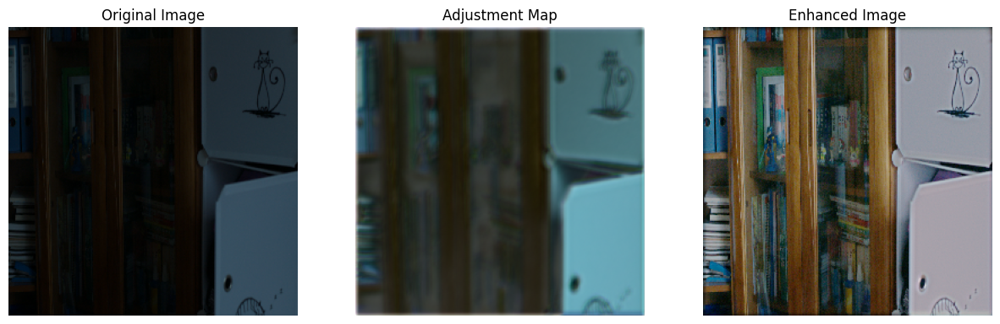

<tf.Tensor: shape=(256, 256, 3), dtype=float32, numpy=
array([[[1.89840585e-01, 2.79466748e-01, 3.00038725e-01],
        [1.62940055e-01, 2.88758576e-01, 2.97505260e-01],
        [3.56534183e-01, 4.06009167e-01, 3.81785303e-01],
        ...,
        [3.13562632e-01, 3.40038002e-01, 3.66162479e-01],
        [2.80939221e-01, 2.93583572e-01, 3.01248729e-01],
        [2.12932691e-01, 2.31426254e-01, 2.65042275e-01]],

       [[2.71597207e-01, 3.38679433e-01, 3.61837864e-01],
        [2.77361035e-01, 3.61940116e-01, 4.00629222e-01],
        [3.69185776e-01, 4.57210898e-01, 4.08503652e-01],
        ...,
        [4.07130450e-01, 4.05599982e-01, 4.32591677e-01],
        [3.30482721e-01, 3.35042506e-01, 3.29393059e-01],
        [2.78711528e-01, 3.06770861e-01, 3.05108368e-01]],

       [[2.55550802e-01, 3.40860337e-01, 3.79794866e-01],
        [3.45960587e-01, 4.27275687e-01, 4.93927717e-01],
        [3.84901226e-01, 4.42626357e-01, 4.31132764e-01],
        ...,
        [4.77314442e-01, 4.74481

In [33]:
train_images_low = glob.glob(os.path.join(train_path_low, "*.png"))
train_images_high = glob.glob(os.path.join(train_path_high, "*.png"))
test_images_low = glob.glob(os.path.join(test_path_low, "*.png"))
test_images_high = glob.glob(os.path.join(test_path_high, "*.png"))

def apply_augmentations(image):
    """Apply relevant augmentations for low-light image enhancement"""
    image = tf.image.random_brightness(image, max_delta=0.3)
    image = tf.image.random_contrast(image, lower=0.7, upper=1.3)
    image = tf.image.random_hue(image, max_delta=0.15)
    image = tf.image.random_saturation(image, lower=0.6, upper=1.6)
    return tf.clip_by_value(image, 0.0, 1.0)

def load_and_preprocess_image(image_path, augment=False):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_png(img, channels=3)
    img = tf.image.resize(img, [256, 256])
    img = tf.cast(img, tf.float32) / 255.0
    if augment:
        img = apply_augmentations(img)
    return img

def create_tf_dataset(image_paths, batch_size=8, augment=False):
    dataset = tf.data.Dataset.from_tensor_slices(image_paths)
    dataset = dataset.map(lambda x: load_and_preprocess_image(x, augment=augment), num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.shuffle(buffer_size=1000).batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset

# instantiate model and show architecture 
zero_dce_model = ZeroDCE()
zero_dce_model.build(input_shape=(None, 256, 256, 3))
zero_dce_model.compile(optimizer=optimizer)
zero_dce_model.summary()

# load dataset 
steps_per_epoch = len(train_images_low) // 8  # tot. images divided by batch size
train_dataset = create_tf_dataset(image_paths=train_images_low, batch_size=8, augment=True)

# train model 
print("Starting Zero-DCE Training...")
train_model(zero_dce_model, train_dataset, epochs=10, steps_per_epoch=steps_per_epoch)

# save trained model 
zero_dce_model.save("zero_dce_low_light_enhancement.h5")
print("Training completed and model saved!")

# use test image to see results
test_image_path = "/kaggle/input/lol-eval15-low/1.png"
enhance_and_display(zero_dce_model, test_image_path)

Image: 780.png --> PSNR: 22.37, SSIM: 0.533
Image: 778.png --> PSNR: 15.40, SSIM: 0.487
Image: 493.png --> PSNR: 18.87, SSIM: 0.570
Image: 669.png --> PSNR: 18.11, SSIM: 0.567
Image: 547.png --> PSNR: 23.53, SSIM: 0.577


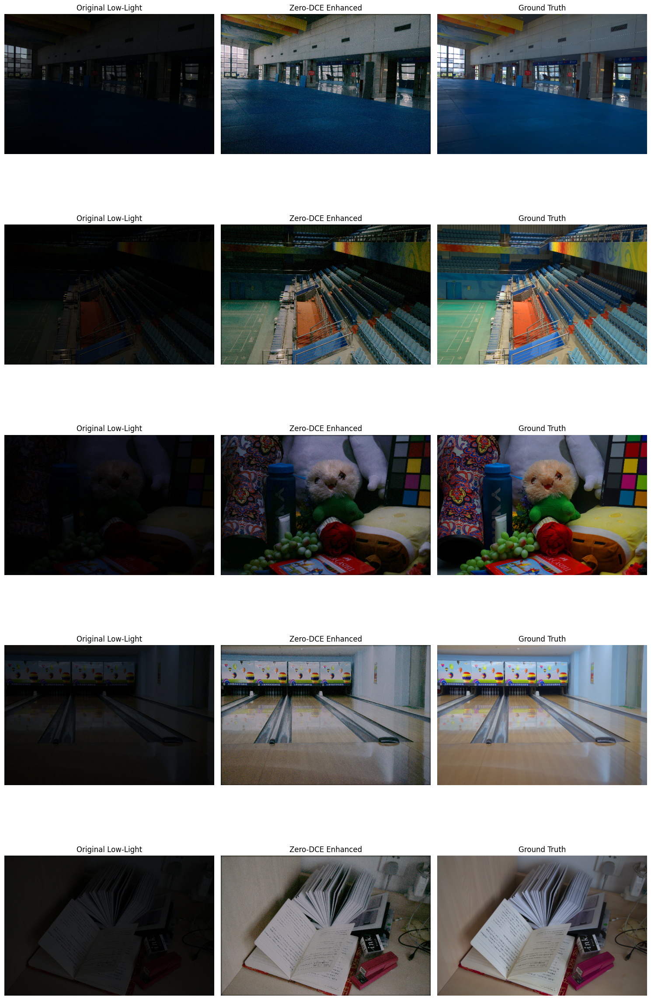

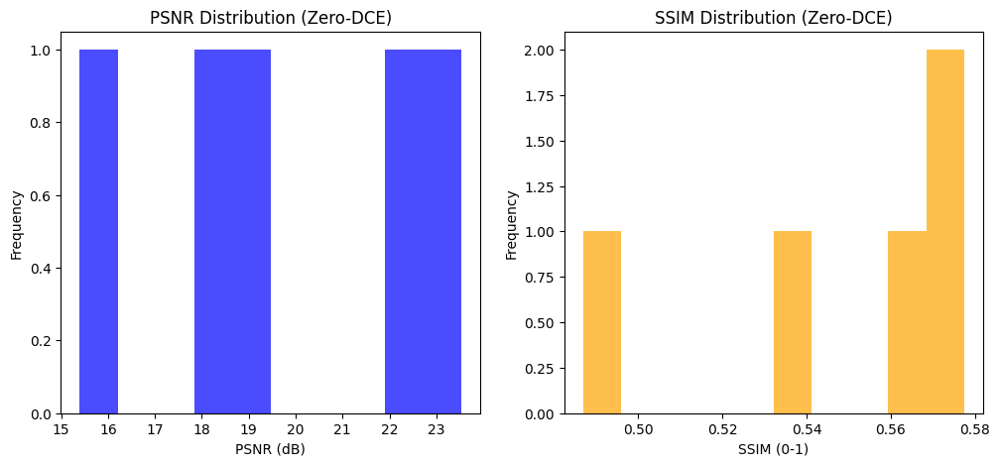

In [34]:
def load_and_preprocess_image(image_path):
    img_data = tf.io.read_file(image_path)
    img = tf.image.decode_image(img_data, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32) # converts to [0,1] 
    return img # (H, W, 3), dtype=float32

def evaluate_zero_dce(image_path, ground_truth_path, zero_dce_model):
    # load and preprocess images
    low_img = load_and_preprocess_image(image_path) # low-light image
    gt_img  = load_and_preprocess_image(ground_truth_path) # gt image
    # expand dims to make a batch of size 1
    low_input = tf.expand_dims(low_img, axis=0)

    # model.call() returns x_r
    x_r = zero_dce_model(low_input, training=False) # shape: (1, H, W, 3)
    x_r = x_r[0].numpy() # remove batch dimension, convert to numpy

    # enhance using apply_enhancement, which expects x, x_r both as Tensors or np arrays 
    # so convert low_img to numpy, then wrap x_r as a tf.Tensor
    low_img_tf = tf.convert_to_tensor(low_img.numpy()) # shape (H, W, 3)
    x_r_tf = tf.convert_to_tensor(x_r)
    
    enhanced_tf = apply_enhancement(low_img_tf, x_r_tf)  
    enhanced_img = enhanced_tf.numpy() # convert to numpy array for metrics

    # clip to valid range
    enhanced_img = np.clip(enhanced_img, 0.0, 1.0)
    gt_img = gt_img.numpy() # convert gt to numpy

    # calc PSNR/SSIM
    psnr_value = psnr(gt_img.astype(np.float32), enhanced_img.astype(np.float32), data_range=1.0)
    ssim_value = ssim(gt_img.astype(np.float32), enhanced_img.astype(np.float32), data_range=1.0, channel_axis=-1)

    return psnr_value, ssim_value, enhanced_img

# eval on 5 test images
zero_dce_psnr_scores = []
zero_dce_ssim_scores = []
zero_dce_images = []

for img_path, gt_path in zip(test_images_low[:5], test_images_high[:5]):
    psnr_value, ssim_value, enhanced_img = evaluate_zero_dce(img_path, gt_path, zero_dce_model)
    zero_dce_psnr_scores.append(psnr_value)
    zero_dce_ssim_scores.append(ssim_value)
    zero_dce_images.append(enhanced_img)
    print(f"Image: {os.path.basename(img_path)} --> PSNR: {psnr_value:.2f}, SSIM: {ssim_value:.3f}")

# visualize results
fig, axes = plt.subplots(len(zero_dce_images), 3, figsize=(15, 5 * len(zero_dce_images)))

for i, (orig_path, enhanced_img, gt_path) in enumerate(zip(test_images_low[:5], zero_dce_images, test_images_high[:5])):
    orig_img = load_and_preprocess_image(orig_path).numpy()
    gt_img   = load_and_preprocess_image(gt_path).numpy()

    axes[i, 0].imshow(orig_img)
    axes[i, 0].set_title("Original Low-Light")
    axes[i, 0].axis("off")
    axes[i, 1].imshow(enhanced_img)
    axes[i, 1].set_title("Zero-DCE Enhanced")
    axes[i, 1].axis("off")
    axes[i, 2].imshow(gt_img)
    axes[i, 2].set_title("Ground Truth")
    axes[i, 2].axis("off")

plt.tight_layout()
plt.show()

# plot distribution of PSNR and SSIM
plt.figure(figsize=(12, 5))
# PSNR
plt.subplot(1, 2, 1)
plt.hist(zero_dce_psnr_scores, bins=10, alpha=0.7, color="blue")
plt.xlabel("PSNR (dB)")
plt.ylabel("Frequency")
plt.title("PSNR Distribution (Zero-DCE)")
# SSIM
plt.subplot(1, 2, 2)
plt.hist(zero_dce_ssim_scores, bins=10, alpha=0.7, color="orange")
plt.xlabel("SSIM (0-1)")
plt.ylabel("Frequency")
plt.title("SSIM Distribution (Zero-DCE)")
plt.show()

# Zero-DCE Results

#### Performance Evaluation

The model was evaluated on five test images using Peak Signal-to-Noise Ratio (PSNR) and Structural Similarity Index (SSIM).

| Image Name | PSNR (dB) | SSIM (0-1) |
|------------|-----------|------------|
| 780.png    | 22.37     | 0.533      |
| 778.png    | 15.40     | 0.487      |
| 493.png    | 18.87     | 0.570      |
| 669.png    | 18.11     | 0.567      |
| 547.png    | 23.53     | 0.577      |

Observations from the Evaluation and Comparison to Baseline ML Models and U-Net: 

- Zero-DCE vs. Baseline ML: Compared to traditional ML models (XGBoost, SVM, Linear Regression), Zero-DCE generally achieves higher PSNR and SSIM. So there is less noise and structures are maintained better.
- Zero-DCE vs. U-Net: While Zero-DCE shows improvements over ML baselines, U-Net consistently demonstrates higher metrics, with some images reaching SSIM values of 0.85+ and PSNR above 25 dB. This means that a fully convolutional approach (U-Net) can capture and restore low-light details better.
- Higher Average PSNR: On average, Zero-DCE reduces noise more effectively than the baseline ML models, but U-Net’s average PSNR is still the highest.
- Enhanced SSIM: Zero-DCE’s SSIM scores are higher than most baseline ML models, but remain below the best U-Net performance. Deeper neural architectures may preserve structure and texture more effectively.

#### Conclusion
Zero-DCE produces clearer, more visually appealing results than the baseline ML methods for low-light enhancement. The PSNR and SSIM metrics for Zero-DCE are improved over baseline models but still fall below U-Net’s performance on the same images.

#### Possible Improvements
- Hyperparameter Tuning: Adjust batch size, loss weights, or optimizer choices to improve Zero-DCE’s convergence
- Consider including a perceptual loss like the U-Net model
- Hybrid Approaches: Integrate ideas from both Zero-DCE and CNN-based methods (like attention) to further refine low-light enhancement
- Train with more images for Zero-DCE to improve convergence

# 6. Model Comparison 

#### Quantitative Metrics
- U-Net has the highest PSNR and SSIM values overall.
- Zero-DCE outperforms the baseline ML models in both metrics and comes close to U-Net’s scores. 
- Baseline ML Models (XGBoost, SVM, Linear Regression) have lower PSNR and SSIM.

#### Qualitative Observations
- Despite U-Net’s higher numerical scores, its oenhacements look hazy, possibly due to aggressive smoothing or global adjustments.  
- Zero-DCE produces clearer and more natural looking images, making it more appealing for low-light enhancement.  
- The baseline ML methods typically lag behind both U-Net and Zero-DCE in visual.

# 7. Conclusions

### Goal: Summarize findings, highlight strengths/weaknesses, suggest improvements

Zero-DCE was significantly faster than U-Net, requiring only 10 epochs that took **about 2 minutes** for good results, while the U-Net training and hyperparameter tuning took **about 3 hours** on two T4 GPUs. Due to Zero-DCE’s lightweight CNN, it can likely run in real-time on smartphones, which is appealing for low-light enhancement in mobile applications.

Despite these advantages, U-Net consistently achieves higher PSNR and SSIM due to deeper feature extraction. However, this comes at the cost of more complex training and longer runtimes. In future work, I'd like to optimize Zero-DCE by fine tuning its parameters (adjusting learning rates or loss weights) and use perceptual loss to improve visual quality. U-Net could benefit from more efficient design strategies (pruning or attention mechanisms) to speed up inference without sacrificing performance.

It is also worth noting that the baseline ML models should be evaluated on the exact same test images as U-Net and Zero-DCE to ensure a fair and consistent comparison across all methods.
  

# 8. References

Depth wise Separable Convolutional Neural Networks. (2022, September 29). *GeeksforGeeks*.  
Retrieved from [https://www.geeksforgeeks.org/depth-wise-separable-convolutional-neural-networks/](https://www.geeksforgeeks.org/depth-wise-separable-convolutional-neural-networks/)

Guo, C., Li, C., Guo, J., Loy, C. C., Hou, J., Kwong, S., & Cong, R. (2020). Zero-Reference Deep Curve Estimation for Low-Light Image Enhancement. In *2020 IEEE/CVF Conference on Computer Vision and Pattern Recognition (CVPR)* (pp. 1777–1786). IEEE. [https://doi.org/10.1109/CVPR42600.2020.00185](https://doi.org/10.1109/CVPR42600.2020.00185)

Eakshit, S. Keras Zero-DCE for low-light image enhancement. (2021, September 18). Retrieved from [https://keras.io/examples/vision/zero_dce/](https://keras.io/examples/vision/zero_dce/)

Li, C., Guo, C., & Loy, C. C. (2021). Learning to Enhance Low-Light Image via Zero-Reference Deep Curve Estimation. *IEEE Transactions on Pattern Analysis and Machine Intelligence*.  
[https://doi.org/10.1109/TPAMI.2021.3063604](https://doi.org/10.1109/TPAMI.2021.3063604)

LOL Dataset. (n.d.). Retrieved from [https://drive.google.com/file/d/157bjO1_cFuSd0HWDUuAmcHRJDVyWpOxB/view](https://drive.google.com/file/d/157bjO1_cFuSd0HWDUuAmcHRJDVyWpOxB/view)

Scikit-Image.(n.d.). *skimage.metrics.peak_signal_noise_ratio*. Retrieved from [https://scikit-image.org/docs/0.24.x/api/skimage.metrics.html#skimage.metrics.peak_signal_noise_ratio](https://scikit-image.org/docs/0.24.x/api/skimage.metrics.html#skimage.metrics.peak_signal_noise_ratio)

Synthetic Pairs from Raw Images. (n.d.). Retrieved from [https://drive.google.com/file/d/1G6fi9Kiu7CDnW2Sh7UQ5ikvScRv8Q14F/view](https://drive.google.com/file/d/1G6fi9Kiu7CDnW2Sh7UQ5ikvScRv8Q14F/view)

TensorFlow. (n.d.). *tf.image.sobel_edges*. Retrieved from [https://www.tensorflow.org/api_docs/python/tf/image/sobel_edges](https://www.tensorflow.org/api_docs/python/tf/image/sobel_edges)

Testing images. (n.d.). Retrieved from [https://drive.google.com/file/d/1OvHuzPBZRBMDWV5AKI-TtIxPCYY8EW70/view](https://drive.google.com/file/d/1OvHuzPBZRBMDWV5AKI-TtIxPCYY8EW70/view)

Wei, C., Wang, W., Yang, W., & Liu, J. (2018). Deep Retinex Decomposition for Low-Light Enhancement. *arXiv preprint arXiv:1808.04560*. Retrieved from [https://arxiv.org/abs/1808.04560](https://arxiv.org/abs/1808.04560)


